Simple Linear Regression

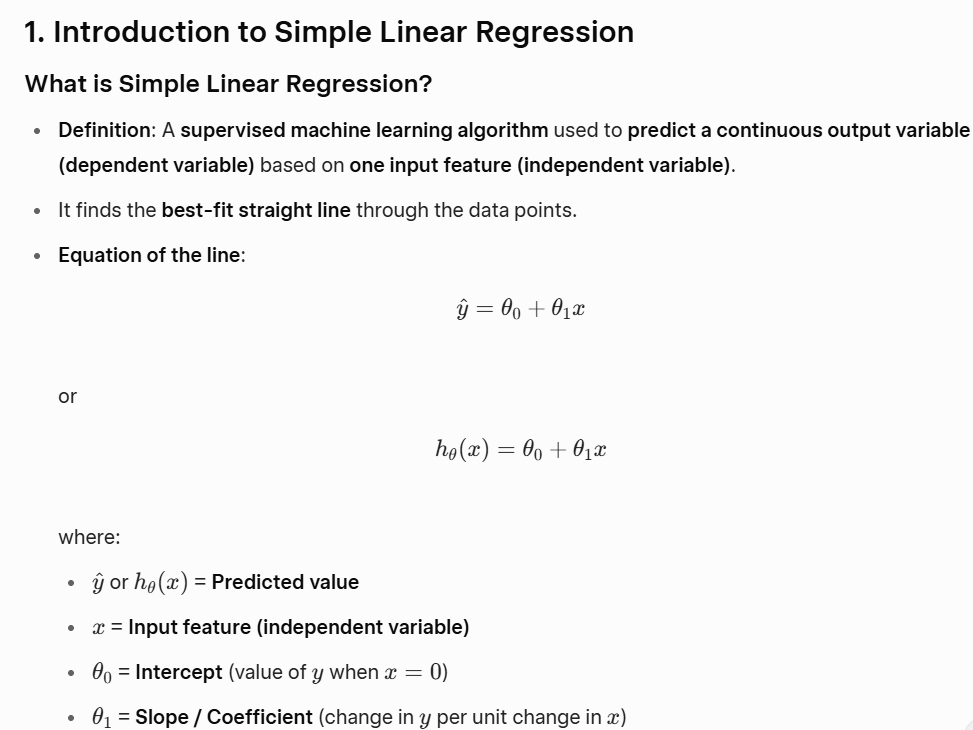

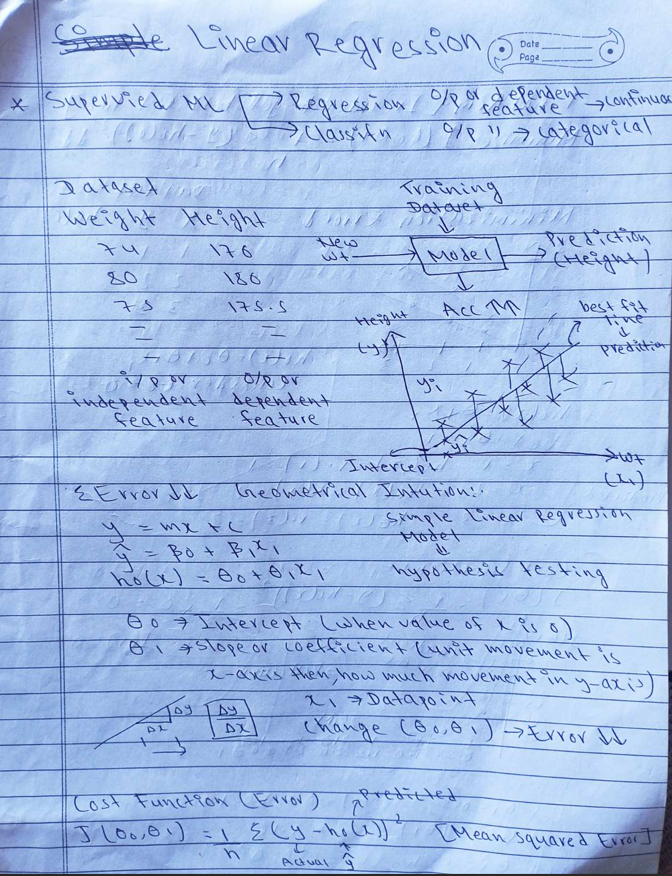

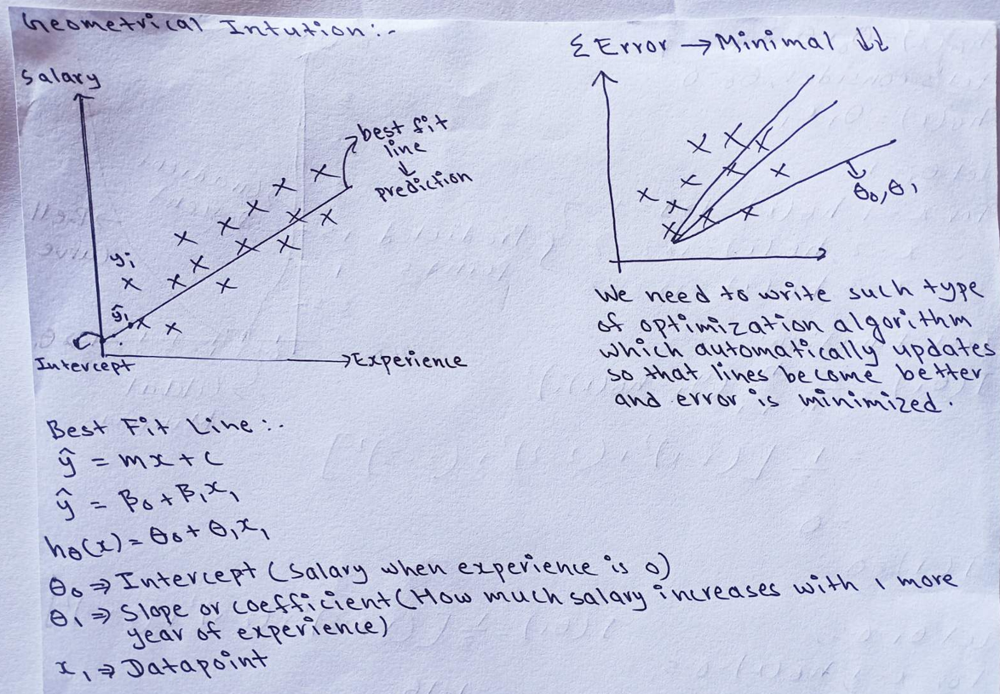

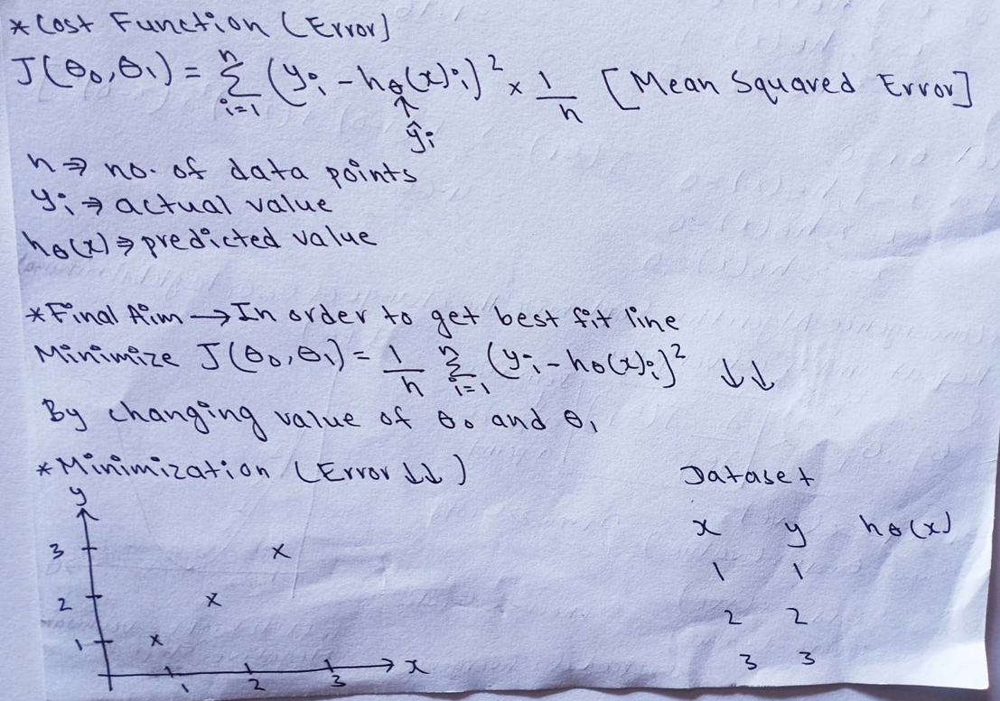

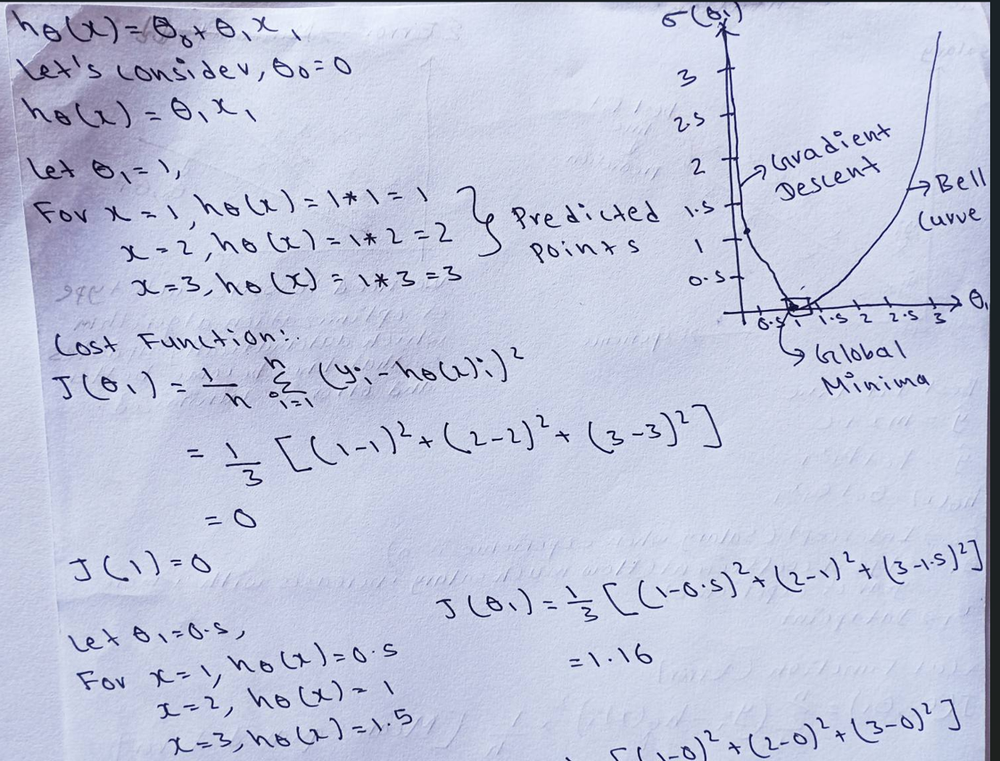

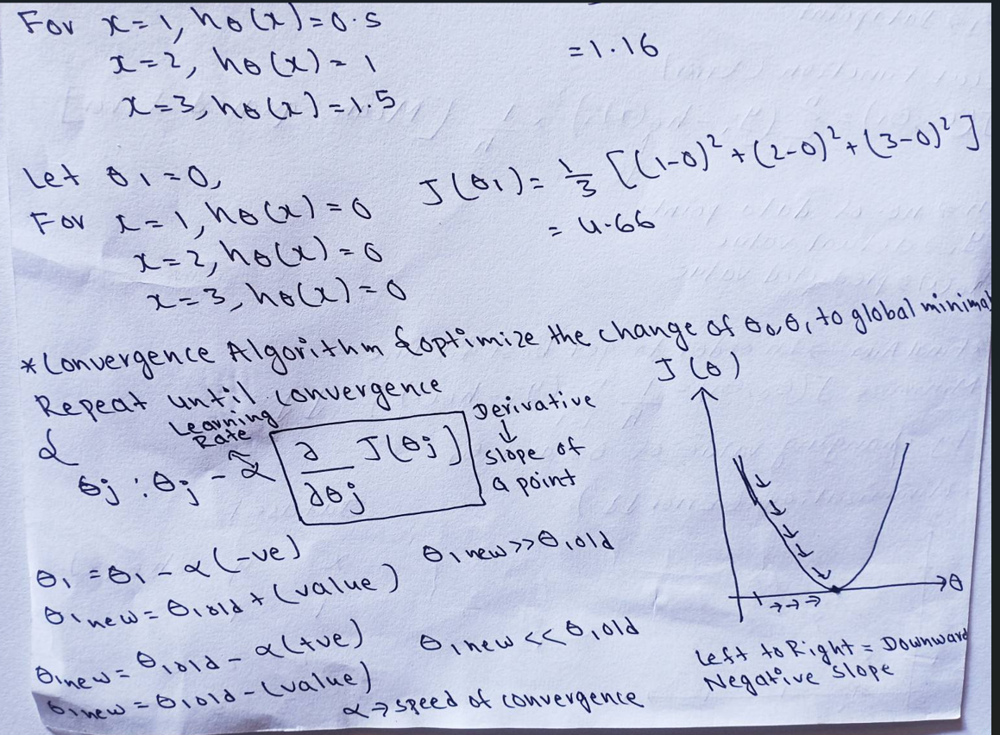

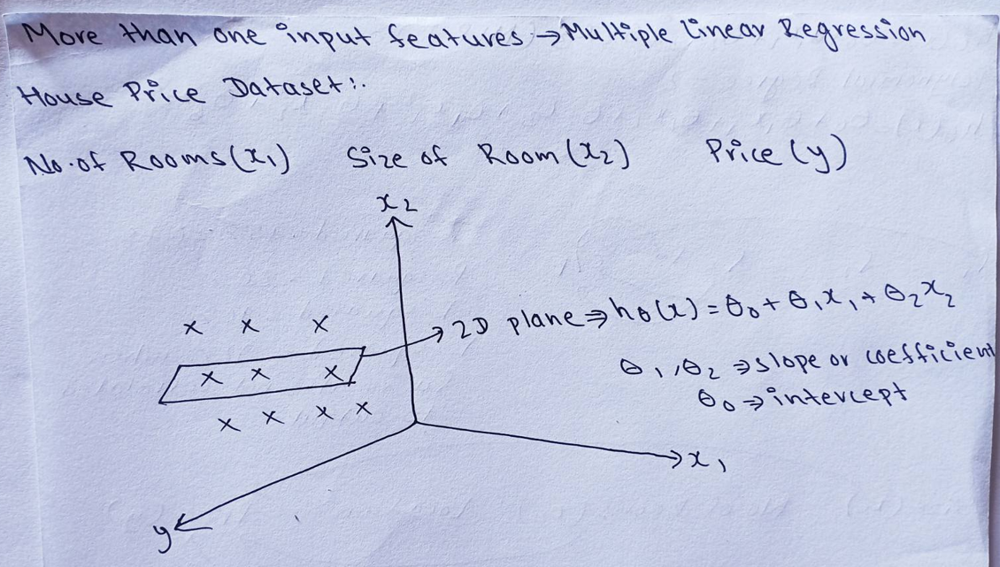

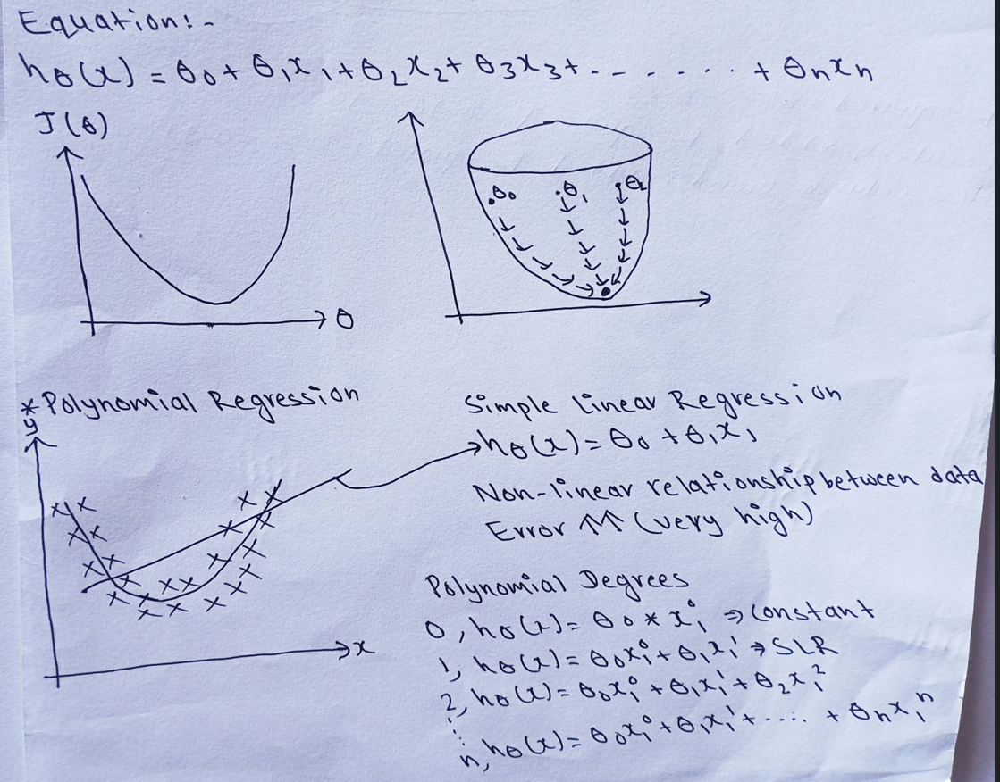

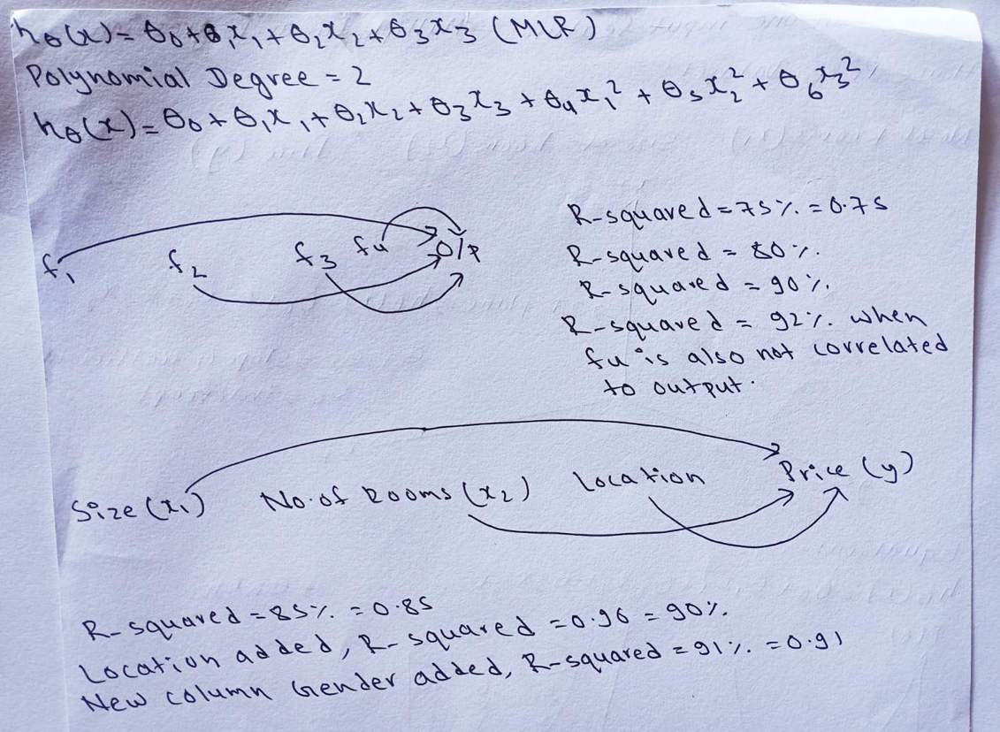

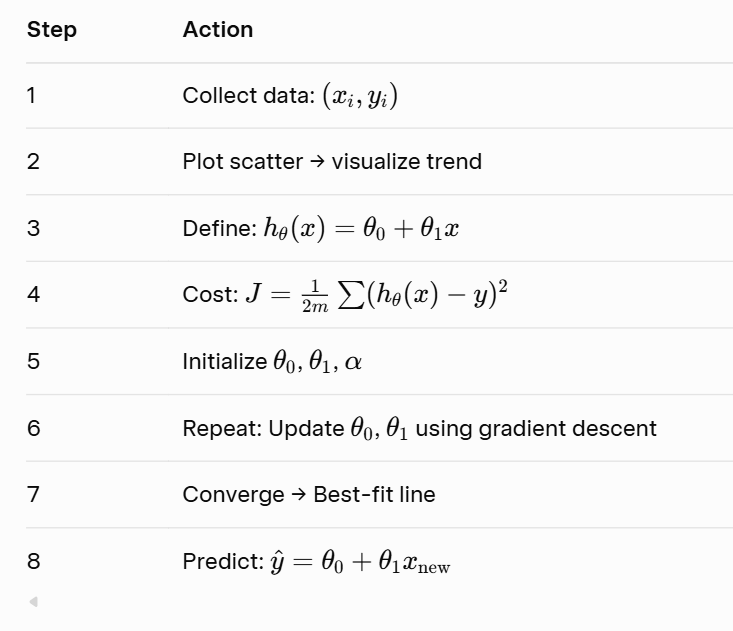

Data Science Life Cycle
- Data Collection(Database,API,Scraping,etc.)
- Data Loading
- Data Cleaning, EDA, Feature Engineering
- Independent and Dependent Feature
- X_train, X_test, y_train, y_test
- Model Train
- Performance Check
- Hyperparamter Tuning
- Save and Deploy Model

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Read the dataset
df = pd.read_csv('height-weight.csv')
df.head()

,Weight,Height
0,70,175
1,65,168
2,80,180
3,55,160
4,90,185


In [ ]:
df.shape

(24, 2)

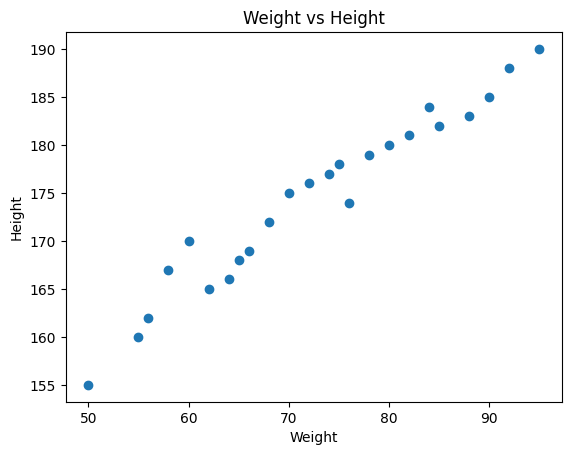

In [ ]:
plt.scatter(df['Weight'], df['Height'])
plt.xlabel('Weight')
plt.ylabel('Height')
plt.title('Weight vs Height')
plt.show()

In [ ]:
df

,Weight,Height
0,70,175
1,65,168
2,80,180
3,55,160
4,90,185
5,60,170
6,75,178
7,85,182
8,50,155
9,95,190


In [ ]:
## Divide the dataset into independent and dependent variables
X = df[['Weight']] # Independent feature
y = df['Height'] # Dependent feature

In [ ]:
X, y

(    Weight
 0       70
 1       65
 2       80
 3       55
 4       90
 5       60
 6       75
 7       85
 8       50
 9       95
 10      68
 11      72
 12      78
 13      62
 14      88
 15      58
 16      82
 17      66
 18      74
 19      64
 20      76
 21      84
 22      56
 23      92,
 0     175
 1     168
 2     180
 3     160
 4     185
 5     170
 6     178
 7     182
 8     155
 9     190
 10    172
 11    176
 12    179
 13    165
 14    183
 15    167
 16    181
 17    169
 18    177
 19    166
 20    174
 21    184
 22    162
 23    188
 Name: Height, dtype: int64)

In [ ]:
# Train Test Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 0)

In [ ]:
X_train

,Weight
16,82
8,50
6,75
17,66
4,90
2,80
5,60
18,74
9,95
7,85


In [ ]:
X.shape, y.shape

((24, 1), (24,))

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((16, 1), (8, 1), (16,), (8,))

In [ ]:
# ## Standardize the dataset over independent train data
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()

In [ ]:
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)

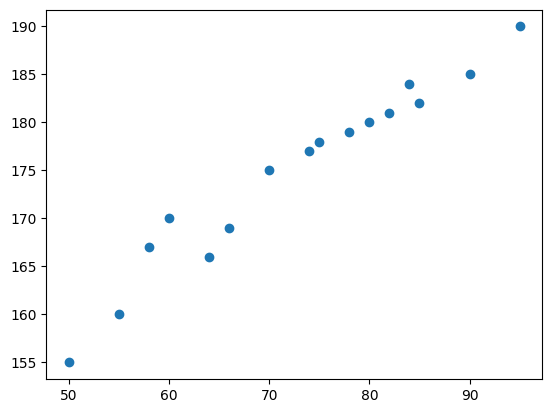

In [ ]:
plt.scatter(X_train, y_train)

In [ ]:
# Train the model Simple Linear Regression
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [ ]:
model

LinearRegression()

In [ ]:
model.fit(X_train, y_train)

LinearRegression()

In [ ]:
print("The slope or coefficient of weight is: ", model.coef_)
print("The intercept of the line is: ", model.intercept_)

The slope or coefficient of weight is:  [0.71127238]
The intercept of the line is:  123.04102564102563


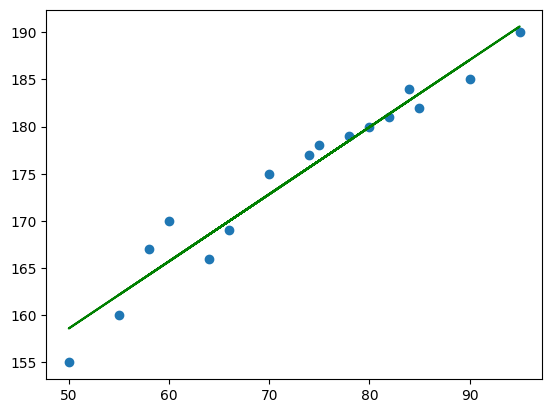

In [ ]:
plt.scatter(X_train, y_train)
plt.plot(X_train, model.predict(X_train), 'g')
plt.show()

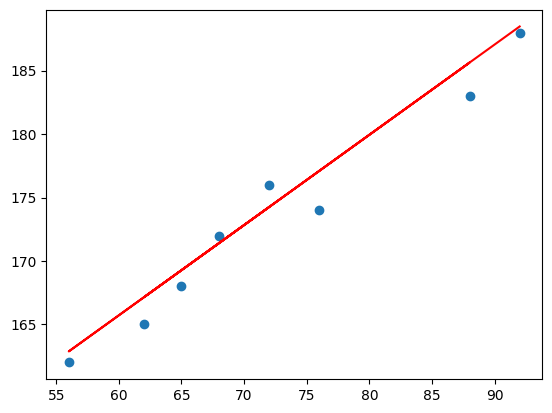

In [ ]:
plt.scatter(X_test,y_test)
plt.plot(X_test, model.predict(X_test), 'r')
plt.show()

In [ ]:
y_pred_test = model.predict(X_test)

In [ ]:
y_pred_test, y_test

(array([174.25263667, 171.40754717, 162.87227866, 185.63299468,
        177.09772617, 169.27373004, 167.13991292, 188.47808418]),
 11    176
 10    172
 22    162
 14    183
 20    174
 1     168
 13    165
 23    188
 Name: Height, dtype: int64)

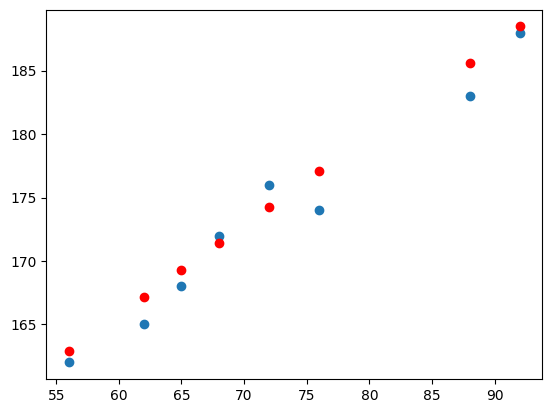

In [ ]:
plt.scatter(X_test, y_test)
plt.scatter(X_test, model.predict(X_test), c= 'r')
plt.show()

Performance Metrics

 MSE, RMSE, MAE

  R2 Score, Adjusted R2 Score

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [ ]:
mse = mean_squared_error(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
print("Mean Squared Error: ", mse)
print("Mean Absolute Error: ", mae)
print("Root Mean Squared Error: ", rmse)

Mean Squared Error:  3.3904871808915185
Mean Absolute Error:  1.6043178519593617
Root Mean Squared Error:  1.841327559368924


In [ ]:
from sklearn.metrics import r2_score
score = r2_score(y_test, y_pred_test)
print(score)
print("R2 Score: ", score * 100, '%')

0.9501398943986541
R2 Score:  95.01398943986541 %


In [ ]:
X_test.shape

(8, 1)

In [ ]:
X_test.shape[1]

1

In [ ]:
# Display Adjusted R2 Score
adjusted_r2 = 1 - (1 - score) * (len(y_test) - 1) / (len(y_test) - X_test.shape[1] - 1)
print("Adjusted R2 Score: ", adjusted_r2 * 100, '%')

Adjusted R2 Score:  94.18298767984298 %


In [ ]:
model

LinearRegression()

In [ ]:
## New data point weight is 80

# scaled_weight = scaler.transform([[80]])
# scaled_weight

In [ ]:
weight = [[70]]

In [ ]:
print('The height of the person with weight 100 is: ', model.predict(weight))

The height of the person with weight 100 is:  [172.83009192]


Assumptions of Linear Regressionss

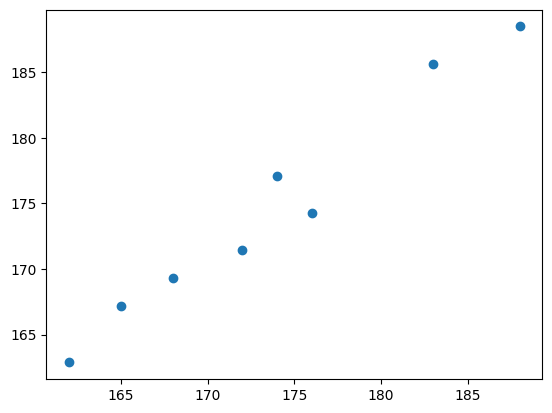

In [ ]:
## Plot a scatter plot for the prediction
plt.scatter(y_test, y_pred_test)

In [ ]:
# Residuals
residuals = y_test - y_pred_test
print(residuals)

11    1.747363
10    0.592453
22   -0.872279
14   -2.632995
20   -3.097726
1    -1.273730
13   -2.139913
23   -0.478084
Name: Height, dtype: float64


In [ ]:
import seaborn as sns

<Axes: xlabel='Height', ylabel='Density'>

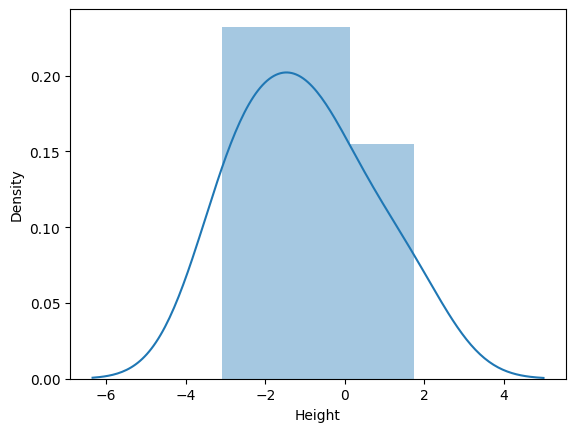

In [ ]:
# Plot the residuals
sns.distplot(residuals, kde = True)

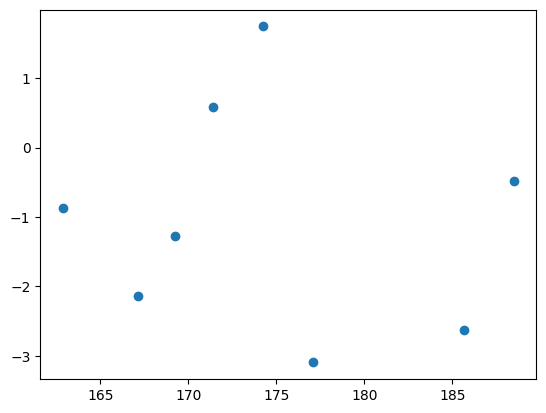

In [ ]:
## Scatter plot with respect to prediction and residuals
# uniform distribution
plt.scatter(y_pred_test, residuals)